# Solving orbital equations with different algorithms

We consider energy plots and orbital solutions in polar coordinates for the general potential energy

$\begin{align}
   U(r) = -G m_1 m_2 / r
\end{align}$

If the force $\bf{F(r)}$ is conservitive then the system has potential energy $U(r)$, then the total energy
of the two body system is

$\begin{align}
   E_{tot} = \frac{1}{2} m_1 \mathbf{\dot x_1^2} + \frac{1}{2} m_2 \mathbf{\dot x_2^2} + U(r)
\end{align}$

In [26]:
%matplotlib inline
import numpy as np
from scipy.integrate import odeint, solve_ivp

import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML

In [2]:
class Orbit():
        """
        This class implements the motion for two particles
        orbiting under gravitational attraction
        
        Parameters:
        m1 : float : Mass of body one
        m2 : float : Mass of body two
        G  : float : Gravitational Constant
        
        Methods:
        dz_dt(t,z)
            Returns the right side f the differential equation in vector z,
            given time t and the corresponding value of z
        """
        
        def __init__ (self, m1=1.0, m2=1.0, G=1.0):
                self.m1 = m1
                self.m2 = m2
                self.G  = G
        
        def dz_dt(self,t,z):
            #Returns the right hand side of the differential equation
            r_12 = np.sqrt( (z[0] - z[4])**2 + (z[2]-z[6])**2 )
            return [ \
                    z[1], self.G * self.m2 * (z[4] - z[0]) / r_12**3, \
                    z[3], self.G * self.m2 * (z[6] - z[2]) / r_12**3, \
                    z[5], -self.G * self.m1 * (z[4] - z[0]) / r_12**3, \
                    z[7], -self.G * self.m1 * (z[6] - z[2]) / r_12**3, \
                   ]
        def solve_ode(self, t_pts, z0, abserr=1.0e-8, relerr=1.0e-8):
            #Solve the ode given initial conditions
            solution = solve_ivp(self.dz_dt, (t_pts[0], t_pts[-1]),
                                    z0, t_eval=t_pts, method = 'RK23',
                                    atol=abserr, rtol=relerr)
            x1, x1_dot, y1, y1_dot, x2, x2_dot, y2, y2_dot = solution.y
            return x1,x1_dot,y1,y1_dot,x2,x2_dot,y2,y2_dot
        def solve_ode_leapfrog(self, t_pts, z0):
            #Solve the ode using the leapfrog method
            delta_t = t_pts[1] - t_pts[0]
            
            x1_0, x1_dot_0, y1_0, y1_dot_0, x2_0, x2_dot_0, y2_0, y2_dot_0 = z0
            num_t_pts=len(t_pts)
            x1 = np.zeros(num_t_pts)
            x1_dot = np.zeros(num_t_pts)
            x1_dot_half = np.zeros(num_t_pts)
            y1 = np.zeros(num_t_pts)
            y1_dot = np.zeros(num_t_pts)
            y1_dot_half = np.zeros(num_t_pts)
            x2 = np.zeros(num_t_pts)
            x2_dot = np.zeros(num_t_pts)
            x2_dot_half = np.zeros(num_t_pts)
            y2 = np.zeros(num_t_pts)
            y2_dot = np.zeros(num_t_pts)
            y2_dot_half = np.zeros(num_t_pts)
            
            #set initial conditions
            x1[0] = x1_0
            x1_dot[0] = x1_dot_0
            y1[0] = y1_0
            y1_dot[0] = y1_dot_0
            x2[0] = x2_0
            x2_dot[0] = x2_dot_0
            y2[0] = y2_0
            y2_dot[0] = y2_dot_0
            
            #step through differential equation
            for i in np.arange(num_t_pts - 1):
                t = t_pts[i]
                
                z = [x1[i], x1_dot[i], y1[i], y1_dot[i],\
                    x2[i], x2_dot[i], y2[i], y2_dot[i] ]
                out = self.dz_dt(t,z)
                
                x1_dot_half[i] = x1_dot[i] + out[1] * delta_t/2.0
                x1[i+1] = x1[i] + x1_dot_half[i] * delta_t
                
                y1_dot_half[i] = y1_dot[i] + out[3] * delta_t/2.0
                y1[i+1] = y1[i] + y1_dot_half[i] * delta_t
                
                x2_dot_half[i] = x2_dot[i] + out[5] * delta_t/2.0
                x2[i+1] = x2[i] + x2_dot_half[i] * delta_t
                
                y2_dot_half[i] = y2_dot[i] + out[7] * delta_t/2.0
                y2[i+1] = y2[i] + y2_dot_half[i] * delta_t
                
                z = [ x1[i+1], x1_dot[i], y1[i+1], y1_dot[i],\
                        x2[i+1], x2_dot[i], y2[i+1], y2_dot[i]]
                out = self.dz_dt(t,z)
                
                x1_dot[i+1] = x1_dot_half[i] + out[1] * delta_t/2.0
                y1_dot[i+1] = y1_dot_half[i] + out[3] * delta_t/2.0
                x2_dot[i+1] = x2_dot_half[i] + out[5] * delta_t/2.0
                y2_dot[i+1] = y2_dot_half[i] + out[7] * delta_t/2.0
                
            return x1, x1_dot, y1, y1_dot, x2, x2_dot, y2, y2_dot
            
            

In [3]:
def plot_y_vs_x(x, y, axis_labels=None, label=None, title=None, 
                color=None, linestyle=None, semilogy=False, loglog=False,
                ax=None):
    """
    Generic plotting function: return a figure axis with a plot of y vs. x,
    with line color and style, title, axis labels, and line label
    """
    if ax is None:        # if the axis object doesn't exist, make one
        ax = plt.gca()

    if (semilogy):
        line, = ax.semilogy(x, y, label=label, 
                            color=color, linestyle=linestyle)
    elif (loglog):
        line, = ax.loglog(x, y, label=label, 
                          color=color, linestyle=linestyle)
    else:
        line, = ax.plot(x, y, label=label, 
                    color=color, linestyle=linestyle)

    if label is not None:    # if a label if passed, show the legend
        ax.legend()
    if title is not None:    # set a title if one if passed
        ax.set_title(title)
    if axis_labels is not None:  # set x-axis and y-axis labels if passed  
        ax.set_xlabel(axis_labels[0])
        ax.set_ylabel(axis_labels[1])

    return ax, line

In [4]:
def start_stop_indices(t_pts, plot_start, plot_end):
    start_index = (np.fabs(t_pts-plot_start)).argmin()
    stop_index = (np.fabs(t_pts-plot_end)).argmin()
    return start_index, stop_index

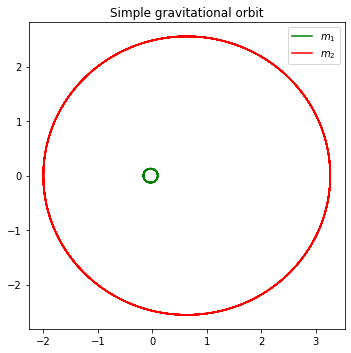

In [17]:
#Set Plotting time
t_start = 0.0
t_end = 10.0
delta_t = 0.01
t_pts = np.arange(t_start, t_end+delta_t, delta_t)
#Set Variable values
G= 20.0
m1 = 20.0
m2 = 1.0
mu = (m1*m2)/(m1+m2) #reduced mass
l = 1. #Angular momentum
#Create a set of orbits
orbit_1 = Orbit(m1, m2, G)
#Initial conditions
x1_0 = .10
x1_dot_0 = 0.0
y1_0 = 0.0
y1_dot_0 = .75
x2_0 = -(m1/m2) * x1_0
x2_dot_0 = -(m1/m2) * x1_dot_0
y2_0 = -(m1/m2) * y1_0
y2_dot_0 = -(m1/m2) * y1_dot_0
z0 = [x1_0, x1_dot_0, y1_0, y1_dot_0,\
      x2_0, x2_dot_0, y2_0, y2_dot_0]
x1,x1_dot,y1,y1_dot, x2, x2_dot, y2, y2_dot = orbit_1.solve_ode(t_pts, z0)

#Calcultae energy points
r_pts = [0] * len(t_pts)
r_dot_pts = [0] * len(t_pts)
U_rk = [0] * len(t_pts)
for i in range(0,len(t_pts)):
    r_pts[i] = np.sqrt( (x1[i]-x2[i])**2 + (y1[i]-y2[i])**2 )
    r_dot_pts[i] = np.sqrt( (x1_dot[i]-x2_dot[i])**2 + (y1_dot[i]-y2_dot[i])**2 )
    U_rk[i] = (mu/2.)*(r_dot_pts[i])**2 + (-1. * G*m1*m2/r_pts[i]) + l**2/(2.*mu*r_pts[i]**2)
    #if i<10 : print(U_rk[i])
    
#Add plot
fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(1,1,1)
start, stop = start_stop_indices(t_pts, t_start,t_end)
ax.plot(x1,y1, color= 'green', label = r'$m_1$')
ax.plot(x2,y2, color = 'red', label = r'$m_2$')
ax.set_title('Simple gravitational orbit')
ax.legend()
ax.set_aspect(1)
fig.tight_layout()
fig.savefig('simple_orbits.png', bbox_inches='tight')


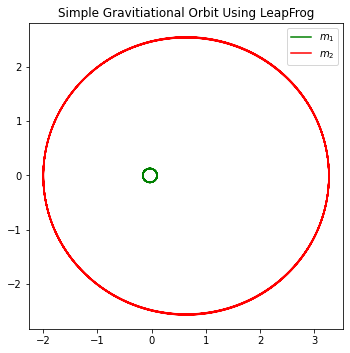

In [22]:
#Set Plotting time
t_start = 0.0
t_end = 10.0
delta_t = 0.01
t_pts = np.arange(t_start, t_end+delta_t, delta_t)
#Variables
G= 20.0
m1 = 20.0
m2 = 1.0
mu = (m1*m2)/(m1+m2) #reduced mass
l = 1. #Angular momentum
#Create a set of orbits
orbit_2 = Orbit(m1, m2, G)
#Initial conditions
x1_0 = .1
x1_dot_0 = 0.0
y1_0 = 0.0
y1_dot_0 = .75
x2_0 = -(m1/m2) * x1_0
x2_dot_0 = -(m1/m2) * x1_dot_0
y2_0 = -(m1/m2) * y1_0
y2_dot_0 = -(m1/m2) * y1_dot_0
z0 = [x1_0, x1_dot_0, y1_0, y1_dot_0,\
      x2_0, x2_dot_0, y2_0, y2_dot_0]
x1,x1_dot,y1,y1_dot, x2, x2_dot, y2, y2_dot = orbit_2.solve_ode_leapfrog(t_pts, z0)

#Calcultae energy points
r_pts_lf = [0] * len(t_pts)
r_dot_pts_lf = [0] * len(t_pts)
U_lf = [0] * len(t_pts)
for i in range(0,len(r_pts_lf)):
    r_pts_lf[i] = np.sqrt( (x1[i]-x2[i])**2 + (y1[i]-y2[i])**2 )
    r_dot_pts_lf[i] = np.sqrt( (x1_dot[i]-x2_dot[i])**2 + (y1_dot[i]-y2_dot[i])**2 )
    U_lf[i] = (mu/2.)*(r_dot_pts_lf[i])**2 + (-1. * G*m1*m2/r_pts_lf[i]) + l**2/(2.*mu*r_pts_lf[i]**2)
    #if i<10 : print(U_lf[i])

#create figure
fig = plt.figure(figsize=(5,5))
ax=fig.add_subplot(1,1,1)
start,stop = start_stop_indices(t_pts,t_start,t_end)
ax.plot(x1, y1, color='green', label = r'$m_1$')
ax.plot(x2, y2, color = 'red' , label = r'$m_2$')
ax.set_title('Simple Gravitiational Orbit Using LeapFrog')
ax.legend()
ax.set_aspect(1)
fig.tight_layout()
fig.savefig('orbit_leapfrog.png', bbox_inches='tight')



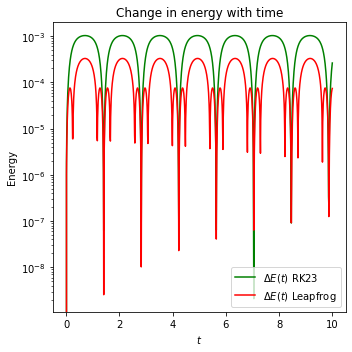

In [23]:
U_rk_0 = U_rk[0]
U_rk_rel_pts = np.abs((U_rk - U_rk_0)/U_rk_0)

U_lf_0 = U_lf[0]
U_lf_rel_pts = np.abs((U_lf - U_lf_0)/U_lf_0)

fig_2 = plt.figure(figsize=(5,5))

ax_2a = fig_2.add_subplot(1,1,1)

ax_2a.semilogy(t_pts, U_rk_rel_pts,color='green', label=r'$\Delta E(t)$ RK23')

ax_2a.semilogy(t_pts, U_lf_rel_pts,color='red', label=r'$\Delta E(t)$ Leapfrog')
#ax_2a.set_ylim(1.e-10, 1.e-2)    # (1.e-12, 5)
ax_2a.set_xlabel(r'$t$')
ax_2a.set_ylabel(r'Energy')
ax_2a.set_title('Change in energy with time')
ax_2a.legend()

fig_2.tight_layout()
fig_2.savefig('Leapfrog_energy_test_1.png', bbox_inches='tight')

Create a simple orbit to animate:

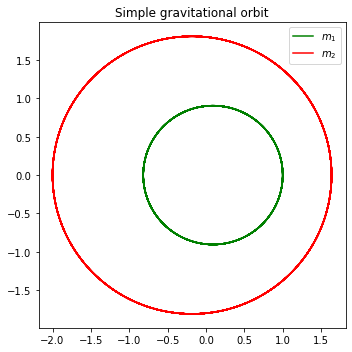

In [25]:
#Set Plotting time
t_start = 0.0
t_end = 50.0
delta_t = 0.01
t_pts = np.arange(t_start, t_end+delta_t, delta_t)
#Set Variable values
G= 10.0
m1 = 2.0
m2 = 1.0

#Create a set of orbits
orbit_1 = Orbit(m1, m2, G)
#Initial conditions
x1_0 = 1.0
x1_dot_0 = 0.0
y1_0 = 0.0
y1_dot_0 = 1.0
x2_0 = -(m1/m2) * x1_0
x2_dot_0 = -(m1/m2) * x1_dot_0
y2_0 = -(m1/m2) * y1_0
y2_dot_0 = -(m1/m2) * y1_dot_0
z0 = [x1_0, x1_dot_0, y1_0, y1_dot_0,\
      x2_0, x2_dot_0, y2_0, y2_dot_0]
x1,x1_dot,y1,y1_dot, x2, x2_dot, y2, y2_dot = orbit_1.solve_ode(t_pts, z0)

#Add plot
fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(1,1,1)
start, stop = start_stop_indices(t_pts, t_start,t_end)
ax.plot(x1,y1, color= 'green', label = r'$m_1$')
ax.plot(x2,y2, color = 'red', label = r'$m_2$')
ax.set_title('Simple gravitational orbit')
ax.legend()
ax.set_aspect(1)
fig.tight_layout()

In [34]:
%%capture

fig_animate = plt.figure(figsize=(5,5), num='Simple Orbit')
ax_animate = fig_animate.add_subplot(1,1,1)
ax_animate.set_xlim(-2.5,2.5)
ax_animate.set_ylim(-2.5,2.5)

line1_animate, = ax_animate.plot(x1,y1, color='green', lw=1)
line2_animate, = ax_animate.plot(x2,y2, color='red', lw=1)
point1_animate, = ax_animate.plot(x1[0], y1[0], 'o', markersize=8, color='green')
point2_animate, = ax_animate.plot(x2[0], y2[0], 'o', markersize=8, color='red')

ax_animate.set_aspect(1)
ax_animate.axis('off')
fig_animate.tight_layout()

In [35]:
def orbit_animation(i):
    #Creates each frame, i, of motion for the orbits
    frame_skip = 2 * i
    point1_animate.set_data(x1[frame_skip],y1[frame_skip])
    point2_animate.set_data(x2[frame_skip],y2[frame_skip])
    return (point1_animate, point2_animate)

In [36]:
frame_interval = 10.0
number_of_frames = 1001
animated_orbit = animation.FuncAnimation(fig_animate,
                                            orbit_animation,
                                            init_func=None,
                                            frames=number_of_frames,
                                            interval=frame_interval,
                                            blit=True,
                                            repeat=False)

In [37]:
HTML(animated_orbit.to_jshtml())